# Specificity analysis


```{dropdown} <i class="fas fa-brain"></i>&nbsp;&nbsp;&nbsp;Key takeaways

:::{card}
:link: air-repertoire-specificity-key-takeaway-1
:link-type: ref
The AIR sequence determines the epitope-specificity of the cell.
Cells with similar AIR sequence, bind to the same antigen.
:::

:::{card}
:link: air-repertoire-specificity-key-takeaway-2
:link-type: ref
Specificity can be inferred via Database queries, AIR comparison, or prediction.
:::

:::{card}
:link: air-repertoire-specificity-key-takeaway-3
:link-type: ref
Most approaches are not independently benchmarked and should be used with some caution and additional validation.
:::

```

``````{dropdown} <i class="fa-solid fa-gear"></i>&nbsp;&nbsp;&nbsp;Environment setup
`````{tab-set}
   
````{tab-item} Steps
```{include} ../_static/default_text_env_setup.md
```
````

````{tab-item} yml
```{literalinclude} compositional.yml
:language: yaml
```
````

`````
``````

## Introduction

B- and T-cells recognize their targets via their AIR. Their specificity is determined via the amino acid sequence. Previous studies provided evidence, that the most influencing factor of AIR-target interaction is the CDR3 sequence of the VDJ-chain and to a lesser degree of the CDR3-VJ chain {cite}`springer2021contribution`.

In many studies, determining the individual cell's specificity is of key interest: researcher's can then select the cells relevant to their study and observe their behavior. Specificity screening can be performed via pMHC multimers (TCRs) or antigens (BCRs) tagged with feature barcodes. However, this adds another level of complexity onto study design and further increases cost. 
Computational approaches for inferring specificity can provide this layer of information.

Here, we will introduce the following approaches:

- **Database Query**: IR sequences and their targets from various studies were collected in multiple databases. We can use these to find matches to our single-cell study.
- **Clustering and distances**: {cite}`glanville2017identifying` showed, that IRs with similar receptors have common specificity. This property has been used in multiple approaches for comparing AIRs with distance metrics and unsupervised clustering.
- **Epitope prediction**: Recently, several machine-learning methods were developed that directly predict binding between AIRs and a target. In theory, these methods could be used to directly assign specificity to the AIRs involved in single-cell studies.

However, all three approaches have major pitfalls. The amount of samples in the public databases is severely biased towards diseases and use cases that are commonly researched. Examplatory, this leads to known bindings for only several 100 epitopes sequences for TCRs in the major public databases. Further, a majority amount of samples in these databases does not provide the full AIR sequence (V-, (D-,) and J-genes and CDRs for both chains), but rather focuses on the CDR3, while often only reporting VJ or VDJ sequences.

## TCR specificity analysis

In the following, we will showcase these approaches for TCRs. Previous studies {cite}`davis1988t,rudolph2006tcrs,glanville2017identifying` showed that the TCR is in close contact with the pMHC at the CDR3, specifically, of the β-chain. This is in line with the regions of high variability of the TCR sequence. In {cite}`springer2021contribution` by Springer et al., the importance of different information (elements of the TCR and MHC type) was reported for training a sequence-based classifier, which are mostly in line with these findings:

CDR3β > V- and J-gene > CDR3α > MHC > cell type

We can assume that this importance is similar not only for prediction, but also for querying, clustering, and distance calculation.

:::{warning}
Scirpy changed the format of [its datastructure](https://scirpy.scverse.org/en/latest/data-structure.html#storing-airr-rearrangement-data-in-anndata)
with v0.13. While the overall analysis workflow has not changed, some outputs shown in this chapter might not be accurate anymore. 

See [the scirpy release notes](https://scirpy.scverse.org/en/latest/changelog.html#v0-13-0-new-data-structure-based-on-awkward-arrays) for more details about this change. 
Until we update this chapter, please also refer to the [official scirpy documentation](https://scirpy.scverse.org).
:::

In [1]:
import warnings

warnings.filterwarnings(
    "ignore",
    ".*IProgress not found*",
)

import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import scirpy as ir
import seaborn as sb

Let's load the data from our previous notebooks.

In [2]:
path_data = "data"
path_tcr = f"{path_data}/TCR_01_preprocessed.h5ad"
adata_tcr = sc.read(path_tcr)

In [3]:
# TODO final decision sampling: prosponed until remaining chapters are fixed
adata_tcr = adata_tcr[adata_tcr.obs["patient_id"].isin(["CV0902", "AP6"])].copy()

(air-repertoire-specificity-key-takeaway-2)=
### Database Queries
Here, we will search for TCRs with specificity annotation from previous studies. Common large-scale databases with TCR-epitope pairs are:

- [IEDB](https://www.iedb.org/) {cite}`fleri2017immune`
- [vdjDB](https://vdjdb.cdr3.net/) {cite}`shugay2018vdjdb`
- [McPAS-TCR](http://friedmanlab.weizmann.ac.il/McPAS-TCR/) {cite}`tickotsky2017mcpas`
- [PIRD](https://db.cngb.org/pird/) {cite}`zhang2020pird`
- [immuneCode](https://clients.adaptivebiotech.com/pub/covid-2020)<sup>TM</sup> for covid specific TCRs {cite}`nolan2020large`

The first four general-purpose databases collect TCR-peptide pairs from a wide variety of diseases, while immuneCode focuses on TCRs related to SARS-CoV-2. However, these databases underlie severe bias towards which epitopes are represented. You will therefore need to check, which database contains sufficient disease-specific TCRs for your study. Depending on your use case, databases or study data with specific content might be better suited.

Overall, there is a trade-off between precision and recall depending on the strictness of our query depending on which information we use for defining clonotypes (see clonotype definition). Unfortunately, there are no general guidelines regarding what information should be taken into account. We will demonstrate various degrees of strictness when querying our data against the VDJdb, since it contains the largest variety of different SARS-CoV-2 epitopes in a general-purpose database.

This database can be conveniently accessed via Scirpy. Information on TCR, epitope, and the experimental setup is stored in ```vdjdb.obs``` following common Scirpy format.


In [4]:
vdjdb = ir.datasets.vdjdb()
vdjdb.obs.head(5)

,multi_chain,species,mhc.a,mhc.b,mhc.class,antigen.epitope,antigen.gene,antigen.species,reference.id,method.identification,...,IR_VDJ_2_sequence_id,IR_VJ_1_v_call,IR_VJ_2_v_call,IR_VDJ_1_v_call,IR_VDJ_2_v_call,IR_VJ_1_v_cigar,IR_VJ_2_v_cigar,IR_VDJ_1_v_cigar,IR_VDJ_2_v_cigar,has_ir
cell_id,,,,,,,,,,,,,,,,,,,,,
0,False,HomoSapiens,HLA-B*08,B2M,MHCI,FLKEKGGL,Nef,HIV-1,PMID:15596521,tetramer-sort,...,NaN,TRAV26-1*01,NaN,TRBV13*01,NaN,NaN,NaN,NaN,NaN,True
1,False,HomoSapiens,HLA-B*08,B2M,MHCI,FLKEKGGL,Nef,HIV-1,PMID:15596521,tetramer-sort,...,NaN,NaN,NaN,TRBV13*01,NaN,NaN,NaN,NaN,NaN,True
2,False,HomoSapiens,HLA-B*08,B2M,MHCI,FLKEKGGL,Nef,HIV-1,PMID:15596521,tetramer-sort,...,NaN,TRAV20*01,NaN,TRBV13*01,NaN,NaN,NaN,NaN,NaN,True
3,False,HomoSapiens,HLA-B*08,B2M,MHCI,FLKEKGGL,Nef,HIV-1,PMID:15596521,tetramer-sort,...,NaN,TRAV2*01,NaN,TRBV13*01,NaN,NaN,NaN,NaN,NaN,True
4,False,HomoSapiens,HLA-B*08,B2M,MHCI,FLKEKGGL,Nef,HIV-1,PMID:15596521,tetramer-sort,...,NaN,TRAV38-2/DV8*01,NaN,TRBV14*01,NaN,NaN,NaN,NaN,NaN,True


VDJdb provides us with various additional information of TCR-epitope pairs, such as the method of identification, or the associated disease. Let's show what epitopes and diseases are contained in this database.

In [5]:
vdjdb[vdjdb.obs["antigen.species"] == "SARS-CoV-2"].obs[
    "antigen.epitope"
].value_counts()

YLQPRTFLL     1326
SPRWYFYYL      309
TTDPSFLGRY     254
RLQSLQTYV      150
LTDEMIAQY      135
              ... 
LQAENVTGL        1
LPSYAAFAT        1
LPPVYTNSF        1
LPPANTNSF        1
YYTSNPTTF        1
Name: antigen.epitope, Length: 667, dtype: int64

In [6]:
vdjdb[vdjdb.obs["antigen.species"] == "SARS-CoV-2"].obs[
    "antigen.species"
].value_counts()

SARS-CoV-2    4566
Name: antigen.species, dtype: int64

We can easily observe, that a large fraction of sample points stem from the SARS-CoV-2 derived peptide YLQPRTFLL. This is then also reflected in the distribution of diseases within the database.

#### Manual Query
Queries between two datasets are already integrated in Scirpy and other toolkits such as scRepertoire. To query the single-cell data to a new database it is therefore most convenient, to convert the database to the toolkits format and use the toolkit's functions. However, since they are not available in every toolkit, and we might want to add more constraints (e.g. MHC type), we will show an example how to manually perform a basic query, which can be adapted for other databases, toolkits and constraints. 

First, we will reduce the vdjdb to samples that have overlapping CDR3β sequence to our data. This will greatly reduce the size of the database and thereby reduce computational time.

In [7]:
print(f"Amount of samples in VDJDB: {len(vdjdb)}")
vdjdb_overlap = vdjdb[
    vdjdb.obs["IR_VDJ_1_junction_aa"].isin(adata_tcr.obs["IR_VDJ_1_junction_aa"])
].obs
vdjdb_overlap = vdjdb_overlap[["IR_VDJ_1_junction_aa", "antigen.species"]]
print(f"Amount of overlapping samples in VDJDB: {len(vdjdb_overlap)}")

Amount of samples in VDJDB:  60055
Amount of overlapping samples in VDJDB:  7761


Second, we will annotate the columns in our query data, that have an overlap to the database. We will later use this annotation to work only on the data, where there exists an overlap.

In [8]:
adata_tcr.obs["has_vdjdb_overlap"] = adata_tcr.obs["IR_VDJ_1_junction_aa"].isin(
    vdjdb_overlap["IR_VDJ_1_junction_aa"]
)
adata_tcr.obs["has_vdjdb_overlap"].value_counts()

False    11522
True      1293
Name: has_vdjdb_overlap, dtype: int64

Next, we need to define a function that returns the desired annotation based on the input of various features. Here, we will query for identical CDR3β chains, but in theory, other constraints can be added here as well. Based on this sequence, all entries of VDJdb with the same sequence are selected. From here, we collect all diseases associated with these elements. If several diseases are associated we will return 'ambiguous', otherwise the disease.

In [9]:
def assign_disease(cdr3beta):
    matching_rows = vdjdb_overlap[vdjdb_overlap["IR_VDJ_1_junction_aa"] == cdr3beta]
    diseases = matching_rows["antigen.species"].values.tolist()
    diseases = list(set(diseases))
    if len(diseases) > 1:
        return "ambiguous"
    if len(diseases) == 0:
        return "no entry"
    return diseases[0]

Finally, we apply the function to our query data. The resulting column provides us with a per cell annotation of disease linked to that TCR.

In [10]:
adata_tcr.obs["antigen.species_manual"] = (
    adata_tcr[adata_tcr.obs["has_vdjdb_overlap"]]
    .obs["IR_VDJ_1_junction_aa"]
    .apply(assign_disease)
)
adata_tcr.obs["antigen.species_manual"].value_counts()

CMV                 601
EBV                  83
HIV-1                70
ambiguous            55
SARS-CoV-2           12
HomoSapiens           8
InfluenzaA            7
HCV                   4
TriticumAestivum      1
YFV                   1
DENV2                 1
MCMV                  1
SIV                   1
Name: antigen.species_manual, dtype: int64

We observe several matches towards different diseases. These annotations must be viewed carefully, since they depend on the abundance of the disease in the databases, wrong annotation in the databases, false matches due to incomplete information, and possible MHC restrictions of epitopes. However, from the great abundance of disease-specific TCRs, we could deduct, that one patient has a latent infection towards the Cytomegalovirus (CMV) and Epstein–Barr virus (EBV), which are common in population. However, the third most common disease association is toward the less frequent HIV-1. # todo: might change when different donors are chosen

#### Query with various Strictness

The same query can be performed via toolkits such as Scirpy. First, we calculate the overlap between the TCRs of Query (our single-cell data) and database (here: vdjDB). The resulting matrices for VJ and VDJ receptor (n_ours x n_vdjdb) will contain the entry 1 where the TCRs match between both datasets and a 0 otherwise. 

We provide the following additional information to the function call:

- **metric='identity'**: For now, we only consider exact sequence matches. We will later introduce queries for similar sequences as well. 
- **sequence='aa'**: TCR sequences are compared on an amino-acid level instead of nucleobases, since specificity depends on the protein structure and this information is provided by the VDJdb.  

In [11]:
metric = "identity"
sequence = "aa"
ir.pp.ir_dist(adata_tcr, vdjdb, metric=metric, sequence=sequence)

Next, we will match all cells between Query and database based on the condition we provide:

- **metric='identity'**, **sequence='aa'**: we need to provide the same values as used during distance calculation
- **receptor_arms='VDJ'**: Compare TCRs based on CDR3β. Other options are 'VJ' (α-chain), 'all' (α- and β-chain), and 'any' (either α- or β-chain).
- **dual_ir='primary_only'**: as discussed in the first chapter, T cells can carry a secondary TCR. This parameter determines on which receptor the query is conducted. Other options are 'any' (primary or secondary receptor), and 'all' (primary and secondary receptor).

In [12]:
ir.tl.ir_query(
    adata_tcr,
    vdjdb,
    metric=metric,
    sequence=sequence,
    receptor_arms="VDJ",
    dual_ir="primary_only",
)

100%|█████████████████████████████████████| 6191/6191 [00:04<00:00, 1292.12it/s]


Finally, we can annotate the TCRs in the single-cell data with the annotation of matching entries of the database.

- **metric='identity'**, **sequence='aa'**: Use the same values as provided earlier.
- **include_ref_cols**: list of columns from the reference database, that will be added to the query database. Here, we will add the species of the antigen, and the epitope sequence.
- **suffix**: Here, we mark the different queries we will conduct with a suffix. 

In [13]:
ir.tl.ir_query_annotate(
    adata_tcr,
    vdjdb,
    metric=metric,
    sequence=sequence,
    include_ref_cols=["antigen.species", "antigen.epitope"],
)
adata_tcr.obs["antigen.species"].value_counts()

100%|█████████████████████████████████████| 1690/1690 [00:00<00:00, 5387.03it/s]


CMV                 601
EBV                  83
HIV-1                70
ambiguous            55
SARS-CoV-2           12
HomoSapiens           8
InfluenzaA            7
HCV                   4
TriticumAestivum      1
YFV                   1
DENV2                 1
MCMV                  1
SIV                   1
Name: antigen.species, dtype: int64

We here obtain the same results as our manual query above. The advantage is, that it required less custom code. Also, distance metrics are already implemented, when not querying for exact matches.

Next we perform a similar query, but regarding only the α-chain. We will indicate this assignment by using the suffix '_VJ'. Since we already calculated the matching matrix earlier, we only need to perform the annotation step.

In [14]:
ir.tl.ir_query(
    adata_tcr,
    vdjdb,
    metric=metric,
    sequence=sequence,
    receptor_arms="VJ",
    dual_ir="primary_only",
)
ir.tl.ir_query_annotate(
    adata_tcr,
    vdjdb,
    metric=metric,
    sequence=sequence,
    include_ref_cols=["antigen.species", "antigen.epitope"],
    suffix="_VJ",
)
adata_tcr.obs["antigen.species_VJ"].value_counts()

100%|█████████████████████████████████████| 4064/4064 [00:00<00:00, 5683.50it/s]


ambiguous       927
CMV             466
InfluenzaA      349
MCMV            143
SARS-CoV-2       55
EBV              43
HomoSapiens      27
HCV              11
HIV-1             6
YFV               3
HSV-2             1
Homo sapiens      1
Name: antigen.species_VJ, dtype: int64

Note, that we receive more matches of the α-chain, since it is less variable than the β-chain. This results in many TCRs, that cannot be uniquely assigned to a specific disease and are therefore 'ambiguous'. As expected, we can still observe a many matches towards CMV, reinforcing the probability of an infection. However, there is only limited indication for HIV-specific TCRs.

Finally, we query identical sequences on both receptors:

In [15]:
ir.tl.ir_query(
    adata_tcr,
    vdjdb,
    metric=metric,
    sequence=sequence,
    receptor_arms="all",
    dual_ir="primary_only",
)
ir.tl.ir_query_annotate(
    adata_tcr,
    vdjdb,
    metric=metric,
    sequence=sequence,
    include_ref_cols=["antigen.species", "antigen.epitope"],
    suffix="_fullIR",
)
adata_tcr.obs["antigen.species_fullIR"].value_counts()

100%|███████████████████████████████████████| 328/328 [00:00<00:00, 5088.80it/s]


CMV            87
InfluenzaA     26
EBV            21
ambiguous      16
HomoSapiens     5
HIV-1           4
YFV             3
SIV             1
SARS-CoV-2      1
Name: antigen.species_fullIR, dtype: int64

Since this search was more constrained, we receive less matches. However, these matches are likely to be of higher quality. 

### Distances
To detect cells with shared specificity, we can calculate pairwise sequence distances between their TCRs. This can be either used to group cells within a dataset or to increase the amount of hits, we receive from database queries. For sequence distances, there are generally three different approaches:

- **Edit distances**: calculate the cost of transforming the first into the second sequence.
- **k-mer matching**: compares the occurrence of short motifs of length k between two sequences.
- **Embeddings**: the sequence is embedded into a numeric representation (e.g. via deep learning).

Note, that these approaches have not been independently benchmarked. We will therefore focus here on two selected distance metrics:
- **TCRdist**: this commonly used metric uses the sequences of all CDRs and compares them via transformation cost and gap penalties {cite}`dash2017quantifiable`. The costs are based on the BLOSUM matrix, which indicates the probabilities of substituting one amino acid against another {cite}`henikoff1992amino`. By incorporating the full sequence, accuracy is most likely increased as compared to other approaches, but limits its use, when only a subset of information is provided.
- **TCRmatch**: this novel metric uses all k-mers to compare the overlap in motifs between two TCRs based on their CDR3β sequences {cite}`chronister2021tcrmatch`. It can therefore, also be utilized on most databases, that mainly contain this information. It is also conveniently integrated into IEDB.

These metrics use the AIR sequence as input. Cells with the same receptors will therefore have identical output. To reduce computational cost, we therefore first extract the unique AIRs from the AnnData object into a DataFrame.

### TCRdist

In [16]:
from tcrdist.repertoire import TCRrep

TCRdist requires complete information of CDR3 and V-gene of both chains. We therefore filter all cells missing this information. To avoid problems with categorical entries in the DataFrame, we change the type of all columns to 'str'. Finally, we remove duplicates (i.e., we only consider clonotypes), to reduce computational cost.

In [17]:
adata_tcrdist = adata_tcr[
    ~adata_tcr.obs["chain_pairing"].isin(["No IR", "orphan VDJ", "orphan VJ"])
]

for col in ["IR_VJ_1_v_call", "IR_VDJ_1_v_call"]:
    adata_tcrdist = adata_tcrdist[~adata_tcrdist.obs[col].isna()]
adata_tcrdist = adata_tcrdist.copy()


df_tcrdist = adata_tcrdist.obs[
    [
        "IR_VJ_1_junction_aa",
        "IR_VJ_1_v_call",
        "IR_VJ_1_j_call",
        "IR_VDJ_1_junction_aa",
        "IR_VDJ_1_v_call",
        "IR_VDJ_1_j_call",
        "chain_pairing",
        "patient_id",
        "antigen.species",
        "initial_clustering",
    ]
].copy()

for col in df_tcrdist.columns:
    df_tcrdist[col] = df_tcrdist[col].astype(str)
df_tcrdist = df_tcrdist.drop_duplicates()
df_tcrdist = df_tcrdist.reset_index(drop=True)

We need to adjust our DataFrame to the format required by TCRdist. We therefore rename the columns. Further, TCRdist requires the V-gene subtype, which is not provided in our data. Assuming high similarity between the subtypes, we assign the subtype '*01' to all V-genes. Caution: TCRdist internally re-orders the output DataFrame. We therefore add the index as a column, to later restore the original order.

In [18]:
dict_rename_tcrdist = {
    "IR_VJ_1_junction_aa": "cdr3_a_aa",
    "IR_VJ_1_v_call": "v_a_gene",
    "IR_VDJ_1_junction_aa": "cdr3_b_aa",
    "IR_VDJ_1_v_call": "v_b_gene",
}

df_tcrdist = df_tcrdist.rename(columns=dict_rename_tcrdist)

df_tcrdist["v_a_gene"] = df_tcrdist["v_a_gene"].astype(str) + "*01"
df_tcrdist["v_b_gene"] = df_tcrdist["v_b_gene"].astype(str) + "*01"

df_tcrdist["count"] = 1  # todo

df_tcrdist["index"] = df_tcrdist.index

df_tcrdist.head(5)

,cdr3_a_aa,v_a_gene,IR_VJ_1_j_call,cdr3_b_aa,v_b_gene,IR_VDJ_1_j_call,chain_pairing,patient_id,antigen.species,initial_clustering,counts,index
0,CAVKRGNNARLMF,TRAV21*01,TRAJ31,CASSQTGGQPQHF,TRBV5-1*01,TRBJ1-5,single pair,CV0902,nan,CD8,1,0
1,CAVGAPGDDKIIF,TRAV8-3*01,TRAJ30,CASRPSGLNTDTQYF,TRBV7-9*01,TRBJ2-3,single pair,CV0902,nan,CD8,1,1
2,CAVNSPGGYQKVTF,TRAV8-1*01,TRAJ13,CAISASGGGSSGNTIYF,TRBV10-3*01,TRBJ1-3,single pair,CV0902,nan,CD4,1,2
3,CAVSPFNAGGGNKLTF,TRAV3*01,TRAJ10,CASSQTSGGTDTQYF,TRBV18*01,TRBJ2-3,single pair,CV0902,CMV,CD4,1,3
4,CAEAGRDDKIIF,TRAV5*01,TRAJ30,CASSLSGNSYEQYF,TRBV5-1*01,TRBJ2-7,single pair,CV0902,nan,CD8,1,4


We create a TCR repertoire object, that will contain the pairwise distances between all TCRs. We need to specify the TCRs organism ('human' or 'mouse') and the TCR chains (['alpha', 'beta']).

In [19]:
tr = TCRrep(cell_df=df_tcrdist, organism="human", chains=["alpha", "beta"])

/home/icb/felix.drost/miniconda/envs/bestPractice/lib/python3.8/site-packages/tcrdist/repertoire.py:159: UserWarning: cell_df needs a counts column to track clonal number of frequency

  self._validate_cell_df()
/home/icb/felix.drost/miniconda/envs/bestPractice/lib/python3.8/site-packages/tcrdist/repertoire.py:791: UserWarning: No 'count' column provided; count column set to 1
  warnings.warn("No 'count' column provided; count column set to 1")


The TCR repertoire object contains the pairwise distance of α- and β-chains, which we extract to a DataFrame using our original index.

In [20]:
dist_total = tr.pw_alpha + tr.pw_beta
columns = tr.clone_df["index"].astype(float).astype(int)
df_dist = pd.DataFrame(dist_total, columns=columns, index=columns)

Finally, we plot the pairwise distances into a heatmap plot. Using hierarchical clustering, we group clones with similar TCRs (low TCRdist value).

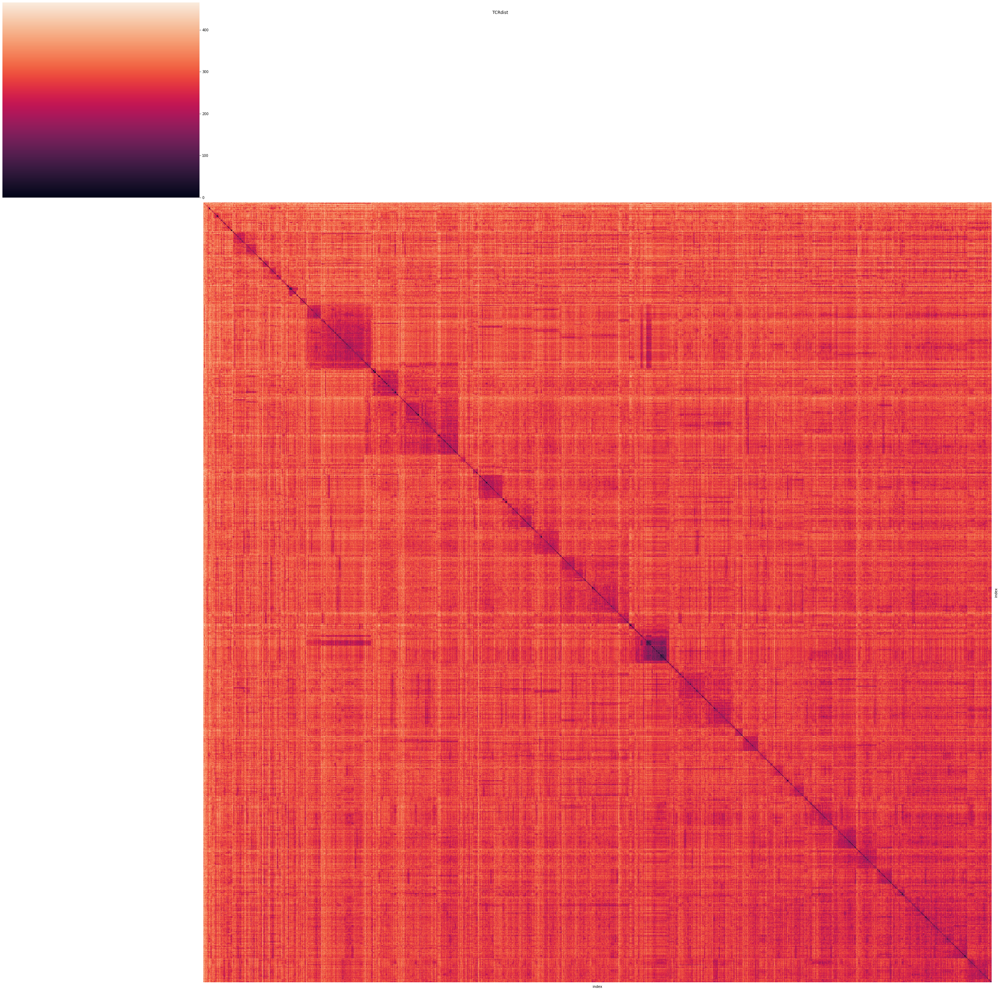

In [21]:
import scipy.cluster.hierarchy as hc
import scipy.spatial as sp
from matplotlib import rcParams

rcParams["figure.figsize"] = (20, 20)

linkage = hc.linkage(sp.distance.squareform(df_dist), method="average")
plot = sb.clustermap(
    df_dist,
    row_linkage=linkage,
    col_linkage=linkage,
    figsize=(40, 40),
    yticklabels=False,
    xticklabels=False,
)
plot.ax_row_dendrogram.set_visible(False)
plot.ax_col_dendrogram.set_visible(False)

plot.fig.suptitle("TCRdist")
plt.tight_layout()

It can be observed, that several clusters of similar receptors form, which can be assumed to have the same epitope specificity. From this pairwise-distances, we can create groups of receptors which are likely to bind to the same epitopes. For this, we switch back to the Scirpy framework, which incorporates tools to create and visualize clonotype frameworks, based on distances of α- and β-chains. 

In [22]:
df_tcrdist_alpha = pd.DataFrame(
    tr.pw_alpha, columns=tr.clone_df["cdr3_a_aa"], index=tr.clone_df["cdr3_a_aa"]
)
df_tcrdist_beta = pd.DataFrame(
    tr.pw_beta, columns=tr.clone_df["cdr3_b_aa"], index=tr.clone_df["cdr3_b_aa"]
)

We will wrap the addition of pairwise distances to the Scirpy object into a function. Overall, it stores the name of distance, the sequences, and the pairwise distances to `adata.uns`. To store the pairwise distances efficiently in a sparse matrix, all entries above a user-defined cutoff (here: 60 per chain, since a commonly used TCRdist cutoff is 120) will be set to 0, and all other distances are shifted by 1 (i.e. perfect matches will have a distance of 1).

In [23]:
from scipy.sparse import csr_matrix


def add_dists(adata, df_dist_alpha, df_dist_beta, name, cutoff):
    adata.uns[f"ir_dist_aa_{name}"] = {
        "params": {"metric": f"{name}", "sequence": "aa", "cutoff": cutoff}
    }

    for chain, dists in [("VJ", df_dist_alpha), ("VDJ", df_dist_beta)]:
        if dists is None:
            continue
        dist_values = dists.values + 1
        dist_values[dist_values > (cutoff + 1)] = 0
        dist_values = csr_matrix(dist_values)
        adata.uns[f"ir_dist_aa_{name}"][chain] = {
            "seqs": dists.index.tolist(),
            "distances": dist_values,
        }


add_dists(adata_tcrdist, df_tcrdist_alpha, df_tcrdist_beta, "tcrdist", 60)

Starting from these pairwise distances, we can define clonotype clusters, with the same parameters as for the database queries.

In [24]:
ir.tl.define_clonotype_clusters(
    adata_tcrdist,
    sequence="aa",
    metric="tcrdist",
    receptor_arms="all",
    dual_ir="primary_only",
)

100%|██████████████████████████████████████| 5325/5325 [00:12<00:00, 432.66it/s]


We can now form and visualize clonotype networks, which contain cells of the different clonotype clusters. For visualization purposes, we will show only clusters with more than 2 cells and more than 2 clonotypes.

<AxesSubplot:>

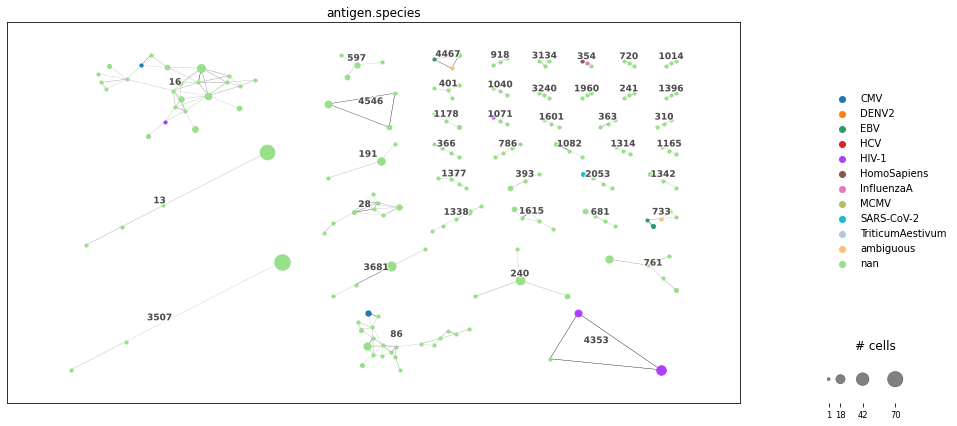

In [25]:
adata_tcrdist.obs["antigen.species"] = adata_tcrdist.obs["antigen.species"].astype(str)

ir.tl.clonotype_network(
    adata_tcrdist, min_cells=3, min_nodes=3, sequence="aa", metric="tcrdist"
)
ir.pl.clonotype_network(
    adata_tcrdist,
    color="antigen.species",
    label_fontsize=9,
    panel_size=(14, 7),
    base_size=10,
    size_power=0.75,
)

We derived a clonotype network graph: all clonotypes within a cluster are likely to have similar epitope specificity. The dot size corresponds to the clonal expansion of this cell. The clonotypes are colored by their antigen specificity assigned by the previous database query. These clusters can be used e.g. as groups for DEG analysis on transcriptome data, or for detecting enriched motifs and preserved residues (see chapter Sequence Analysis).

#### TCRmatch
TCRmatch requires only the CDR3β of the TCR. It can therefore use a wider array of data, since especially less recent studies focused mainly on measuring the β-chain. We will therefore filter all cells that are missing this information and doublet cells. As before, we reduce the sample points to unique sequences to avoid unnecessary computation.

In [26]:
adata_tcrmatch = adata_tcr[
    ~adata_tcr.obs["chain_pairing"].isin(["No IR", "orphan VJ", "multi_chain"])
]
adata_tcrmatch = adata_tcrmatch[
    ~adata_tcrmatch.obs["IR_VDJ_1_junction_aa"].isna()
].copy()

df_tcrmatch = adata_tcrmatch.obs[["IR_VDJ_1_junction_aa", "antigen.species"]].copy()
df_tcrmatch = df_tcrmatch.drop_duplicates()
df_tcrmatch = df_tcrmatch.reset_index(drop=True)
len(df_tcrmatch)

6190

As defined in the documentation, the method uses a Text-File as input, containing only the β-chain, without leading C and ending F or W as provided by the Cell Ranger output. We therefore need to adjust our data accordingly.

In [27]:
df_tcrmatch["CDR3b_trimmed"] = df_tcrmatch["IR_VDJ_1_junction_aa"].str[1:-1]
df_tcrmatch[["CDR3b_trimmed"]].to_csv(
    "tmp/tcrmatch_input.csv", header=False, index=False
)
df_tcrmatch[["CDR3b_trimmed"]].to_csv(
    "tmp/tcrmatch_input.csv", header=False, index=False
)
df_tcrmatch.head(5)

,IR_VDJ_1_junction_aa,antigen.species,CDR3b_trimmed
0,CASSDSSTDTQYF,EBV,ASSDSSTDTQY
1,CASSQTGGQPQHF,NaN,ASSQTGGQPQH
2,CASRPSGLNTDTQYF,NaN,ASRPSGLNTDTQY
3,CASSYGGYNEQFF,CMV,ASSYGGYNEQF
4,CAISASGGGSSGNTIYF,NaN,AISASGGGSSGNTIY


We will call TCRmatch via the command line, with the following arguments:

- **-i**: the query data, here: our input file
- **-t**: amount of cores used for calculation
- **-d**: the reference data, either a database or our input file (for pairwise matches)- **-s**: threshold for considering a match, where 0 is no similarity and 1 is perfect match. Here we use the threshold of medium confidence 0.9. Alternative, you can use the more stricter threshold of 0.97 for high confidence binding. Note, that less stringent cutoffs also result in higher computation times.

In [28]:
cmd_tcrmatch = "cd TCRMatch/ &&"
cmd_tcrmatch += "./tcrmatch -i ../tmp/tcrmatch_input.csv -t 1 -d ../tmp/tcrmatch_input.csv -s 0.9 > ../tmp/tcrmatch_output.csv"

We can call the run command via the bash shell:

In [29]:
!$cmd_tcrmatch

The output file contains all pairwise distances above the specified threshold in long format: i.e., each row contains the two sequences (input_sequence and matching_sequence) and the similarity score. We will transform this DataFrame into wide format, where the rows and the axis represent the matching sequences. To counter numeric instabilities we further ensure symmetry of the matrix. TCRdist provides a similarity with high values representing likely binders. To make it compliant with Scirpy's distance framework we subtract all pairwise distances from 1 and fill all elements for which no threshold exists with 1 (these combinations were formerly below the distance cutoff).

In [30]:
dist_tcrmatch = pd.read_csv("tmp/tcrmatch_output.csv", sep="\t")
dist_tcrmatch = dist_tcrmatch[["input_sequence", "match_sequence", "score"]]
dist_tcrmatch = dist_tcrmatch.pivot("input_sequence", "match_sequence", "score")
values = 1 - (dist_tcrmatch.values + dist_tcrmatch.values.transpose()) / 2

trimmed_2_full = dict(df_tcrmatch[["CDR3b_trimmed", "IR_VDJ_1_junction_aa"]].values)
columns = dist_tcrmatch.index.map(trimmed_2_full)
dist_tcrmatch = pd.DataFrame(index=columns, columns=columns, data=values)
dist_tcrmatch = dist_tcrmatch.fillna(1)
dist_tcrmatch.index.name = None
dist_tcrmatch.head(5)

,CAAGTDYEQYF,CAAQGSSMETQYF,CAARTVNTGELFF,CAAVQGPSYEQYF,CACGAGEDTGELFF,CACGKGGGSLRYTF,CACGPGGPSTDTQYF,CACPSTSGINTGELFF,CACRGLAGYEQYF,CADARSSWDTQYF,...,CSVWTGEGYTF,CSVYTGTSAYEQYF,CSWLAGQETQYF,CTSRMDSNYGYTF,CVFGFRGDTQYF,CVSRDKYEQYF,CVTEGSSYNEQFF,CVTGLAENTQYF,CVTRETGGGGYTF,CVTRYSYEQYF
CAAGTDYEQYF,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
CAAQGSSMETQYF,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
CAARTVNTGELFF,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
CAAVQGPSYEQYF,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
CACGAGEDTGELFF,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


Again, we can demonstrate the pairwise distances in a heatmap plot. You will note, that the majority of entries is below the cutoff threshold.

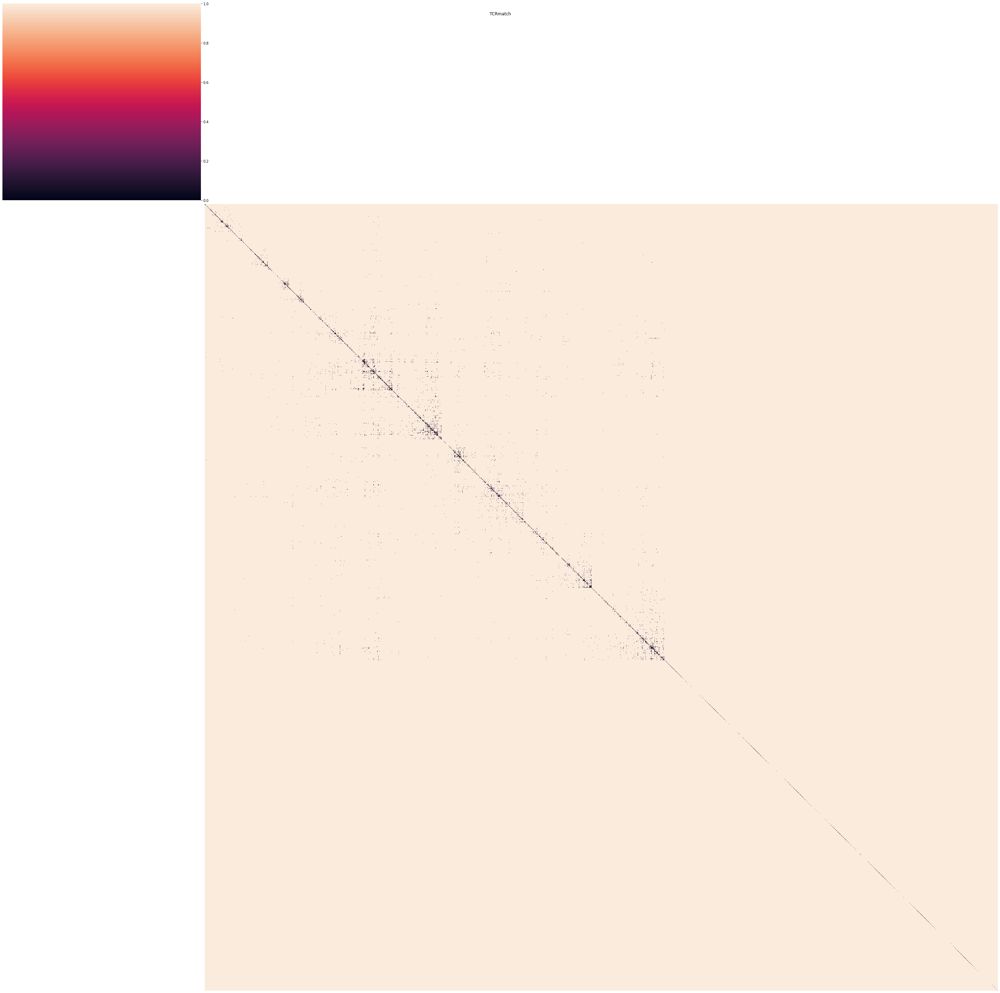

In [31]:
linkage = hc.linkage(sp.distance.squareform(dist_tcrmatch), method="average")
plot = sb.clustermap(
    dist_tcrmatch,
    row_linkage=linkage,
    col_linkage=linkage,
    figsize=(40, 40),
    yticklabels=False,
    xticklabels=False,
)
plot.ax_row_dendrogram.set_visible(False)
plot.ax_col_dendrogram.set_visible(False)
plot.fig.suptitle("TCRmatch")
plt.tight_layout()

Using the function we defined earlier, we can now add this distance metric to the AnnData object in Scirpy-Format and plot the corresponding clonotype networks.

In [32]:
add_dists(adata_tcrmatch, None, dist_tcrmatch, "tcrmatch", 0.05)

100%|█████████████████████████████████████| 6190/6190 [00:02<00:00, 2370.78it/s]


<AxesSubplot:>

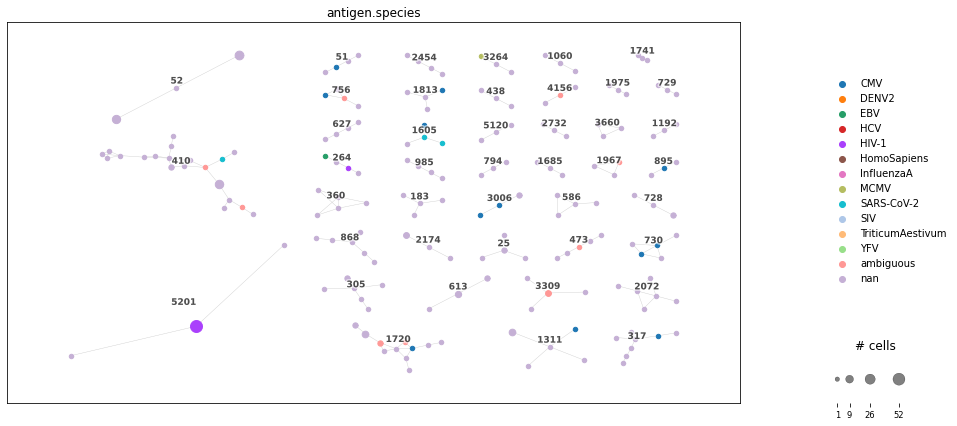

In [33]:
ir.tl.define_clonotype_clusters(
    adata_tcrmatch,
    sequence="aa",
    metric="tcrmatch",
    receptor_arms="VDJ",
    dual_ir="primary_only",
)
ir.tl.clonotype_network(
    adata_tcrmatch, min_cells=1, min_nodes=3, sequence="aa", metric="tcrmatch"
)

adata_tcrmatch.obs["antigen.species"] = adata_tcrmatch.obs["antigen.species"].astype(
    str
)
ir.pl.clonotype_network(
    adata_tcrmatch,
    color="antigen.species",
    label_fontsize=9,
    panel_size=(14, 7),
    base_size=20,
    size_power=0.5,
)

Similarly as for TCRdist, we derived a clonotype network graph, where clones of a subgraph are likely to bind to the same epitopes. Differing, clonotypes are defined via identical CRD3β sequence, which makes this metric applicable for more cells in the dataset or when comparing to databases. 

#### Database query via distance metrics
To increase the amount of annotated cells, we can also query the databases using distance metrics to match similar TCRs. This will lead to more hits, but at the same time also increase the amount of false positives due to inaccuracies of the distance metrics. Here, we show a database query using the Scirpy distance `alignment`, which is similar to TCRdist, but only applied on the CDR3 sequences.

Since this operation is computationally expensive, we will further downsample the data to one donor.

In [34]:
adata_tcr_align = adata_tcr[adata_tcr.obs["patient_id"] == "AP6"].copy()

Using the alignment metrics and a cutoff of 10, we can now call the previously mentioned functions.

In [35]:
metric = "alignment"
sequence = "aa"
ir.pp.ir_dist(adata_tcr_align, vdjdb, metric=metric, sequence=sequence, cutoff=10)

100%|█████████████████████████████████████| 13702/13702 [04:08<00:00, 55.13it/s]


In [36]:
ir.tl.ir_query(
    adata_tcr_align,
    vdjdb,
    metric=metric,
    sequence=sequence,
    receptor_arms="all",
    dual_ir="primary_only",
)

100%|██████████████████████████████████████| 1012/1012 [00:01<00:00, 714.86it/s]


In [37]:
ir.tl.ir_query_annotate(
    adata_tcr_align,
    vdjdb,
    metric=metric,
    sequence=sequence,
    include_ref_cols=["antigen.species", "antigen.epitope"],
    suffix="_alignment",
)
adata_tcr_align.obs["antigen.species_alignment"].value_counts()

100%|█████████████████████████████████████| 2202/2202 [00:00<00:00, 5430.96it/s]


CMV            840
ambiguous      182
HIV-1           30
EBV             20
InfluenzaA      18
SARS-CoV-2       6
HomoSapiens      4
HCV              1
Name: antigen.species_alignment, dtype: int64

We can see, that we receive more matches, as compared when querying for direct matches. On the same hand, the amount of receptors that have ambiguous annotation increases as well.

(air-repertoire-specificity-key-takeaway-1)=
(air-repertoire-specificity-key-takeaway-3)=
### Epitope Prediction

Instead of comparing TCR sequences, binding is directly predicted in this approach from the TCR sequence. This can be helpful, when there is no sufficient amount of TCRs for a specific disease present in a database. These approaches train machine learning models on TCR- and epitope-sequences, which biases these models towards the high-abundant epitopes within the public databases. Generally, two approaches can be observed:

- **Categorical models**: The target epitope is used as category. Therefore, the model predicts binding to a fixed set of epitopes from the TCR sequence. 
- **Epitope-Sequence models**: The model uses the TCR- and epitope-sequence to predict binding, which has the advantage, that arbitrary epitopes can be used. However, it has been shown that performance is greatly reduced for unknown epitopes. 

We therefore advise to check the training data of the model, whether it contains the epitopes of interest. Still, these tools should be used with caution until their performance is further evaluated in a standardized benchmark for their individual strengths and weaknesses. However, we expect a great increase in performance of similar tools in the near future, providing us with a high-quality prediction of specificity.

Out of several tools, we choose ERGO-II {cite}'springer2021contribution'. Since performance comparison still largely remains unknown, we choose a tool which incorporates the different AIR information in a flexible manner allowing a degree of missing data.

First, we will filter our TCR DataFrame to include only samples with a β chain, since this input is required by ERGO-II. Additionally, we also exclude doublet cells ('multi_chains'). ERGO-II allows missing values for all information except the CDR3β, but other tools might not. So check, what information is required for the specific tool.

In [38]:
adata_ergo = adata_tcr[
    ~adata_tcr.obs["chain_pairing"].isin(["orphan VJ", "no IR", "multi_chains"])
]
df_ergo = adata_ergo.obs[
    [
        "IR_VJ_1_junction_aa",
        "IR_VJ_1_v_call",
        "IR_VJ_1_j_call",
        "IR_VDJ_1_junction_aa",
        "IR_VDJ_1_v_call",
        "IR_VDJ_1_j_call",
    ]
].copy()

Most tools are not using the Scirpy naming convention, we therefore need to rename the columns to match the convention specified in the documentation.

In [39]:
dict_rename = {
    "IR_VJ_1_junction_aa": "TRA",
    "IR_VJ_1_v_call": "TRAV",
    "IR_VJ_1_j_call": "TRAJ",
    "IR_VDJ_1_junction_aa": "TRB",
    "IR_VDJ_1_v_call": "TRBV",
    "IR_VDJ_1_j_call": "TRBJ",
}
df_ergo = df_ergo.rename(columns=dict_rename)

Next, we add the remaining information. For the epitope sequence, we choose the epitope 'KLGGALQAK' from the CMV, since we identified an underlying infection earlier. Since T-cell type information only contributed negligible, we set it to 'None' for all rows. We do not have annotation of MHC type, so we also set this column to 'None'. Finally, we save the models input as '.csv'-File.

In [40]:
df_ergo["Peptide"] = "KLGGALQAK"  #'YLQPRTFLL'
df_ergo["T-Cell-Type"] = None
df_ergo["MHC"] = None

df_ergo.to_csv("tmp/ergo_input.csv")

The model is called via the command line. We activate the environment and call the tool by specifying the database it was trained on ('vdjdb') and providing the path to the input file. Note: we uncommented line 105 of 'Predict.py' to save the output to file. There are several reported bugs, when setting up this model (see Github issues), which you will need to fix before running the model. Alternatively, you can use the web interface as described on the GitHub-page.

In [41]:
cmd_ergo = "source ~/.bashrc &&"
cmd_ergo += "conda activate ergo &&"
cmd_ergo += "cd ERGO-II &&"
cmd_ergo += "python Predict.py vdjdb ../tmp/ergo_input.csv"
# cmd_ergo += 'cd ..'

In [42]:
!$cmd_ergo

/home/icb/felix.drost/miniconda/envs/ergo/lib/python3.8/site-packages/pytorch_lightning/core/decorators.py:13: UserWarning: data_loader decorator deprecated in 0.7.0. Will remove 0.9.0
  warnings.warn(w)
                         cell_id              TRA  ... MHC     Score
0      BGCV01_AAACCTGAGACCGGAT-1              NaN  ... NaN  0.000002
1      BGCV01_AAACCTGAGGAACTGC-1    CAVKRGNNARLMF  ... NaN  0.629516
2      BGCV01_AAACCTGAGGGATCTG-1    CAVGAPGDDKIIF  ... NaN  0.635792
3      BGCV01_AAACCTGCAACGCACC-1              NaN  ... NaN  0.000017
4      BGCV01_AAACCTGCACGTGAGA-1   CAVNSPGGYQKVTF  ... NaN  0.625245
...                          ...              ...  ...  ..       ...
12362     S12_TTTGTCAGTAGAAAGG-1      CARNTGNQFYF  ... NaN  0.614335
12363     S12_TTTGTCAGTCCAACTA-1              NaN  ... NaN  0.000023
12364     S12_TTTGTCAGTGAGTGAC-1      CARNTGNQFYF  ... NaN  0.614335
12365     S12_TTTGTCATCCACTCCA-1    CAVSELGSEKLVF  ... NaN  0.685439
12366     S12_TTTGTCATCGCATGAT-1  CVV

After calling the command via the bash shell, we can read the output file.

In [43]:
df_tcr_ergo = pd.read_csv("ERGO-II/results.csv", index_col=0)
df_tcr_ergo.head()

,TRA,TRAV,TRAJ,TRB,TRBV,TRBJ,Peptide,T-Cell-Type,MHC,Score
cell_id,,,,,,,,,,
BGCV01_AAACCTGAGACCGGAT-1,NaN,NaN,NaN,CASSDSSTDTQYF,TRBV6-4,TRBJ2-3,KLGGALQAK,NaN,NaN,0.000002
BGCV01_AAACCTGAGGAACTGC-1,CAVKRGNNARLMF,TRAV21,TRAJ31,CASSQTGGQPQHF,TRBV5-1,TRBJ1-5,KLGGALQAK,NaN,NaN,0.629516
BGCV01_AAACCTGAGGGATCTG-1,CAVGAPGDDKIIF,TRAV8-3,TRAJ30,CASRPSGLNTDTQYF,TRBV7-9,TRBJ2-3,KLGGALQAK,NaN,NaN,0.635792
BGCV01_AAACCTGCAACGCACC-1,NaN,NaN,NaN,CASSYGGYNEQFF,TRBV6-5,TRBJ2-1,KLGGALQAK,NaN,NaN,0.000017
BGCV01_AAACCTGCACGTGAGA-1,CAVNSPGGYQKVTF,TRAV8-1,TRAJ13,CAISASGGGSSGNTIYF,TRBV10-3,TRBJ1-3,KLGGALQAK,NaN,NaN,0.625245


We can now visualize the distribution of predicted binding score.

/home/icb/felix.drost/miniconda/envs/bestPractice/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Score', ylabel='Density'>

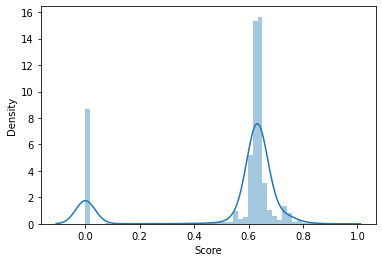

In [44]:
sb.distplot(df_tcr_ergo["Score"])

In [45]:
import numpy as np

np.sum(df_tcr_ergo["Score"] >= 0.9)

1

TODO: Interpretation once donors fixed.

## BCR specificity analysis

Generally, approaches for inferring specificity of BCRs are similar to TCRs. Following, we will stick to the same structure as above with limited explanation, when the topic already has been introduced.

In [2]:
path_data = "data"
path_bcr = f"{path_data}/BCR_01_preprocessed.h5ad"
adata_bcr = sc.read(path_bcr)

In [3]:
adata_bcr = adata_bcr[
    adata_bcr.obs["patient_id"].isin(
        ["COVID-030", "IVLPS-6", "COVID-064", "COVID-014", "COVID-027", "COVID-024"]
    )
].copy()

### Database Queries

Here, we will search for BCRs with specificity annotatation from previous studies. Common large-scale databases with BCR-epitope pairs are:
- [IEDB](https://www.iedb.org/) {cite}`fleri2017immune`
- [PIRD](https://db.cngb.org/pird/) {cite}`zhang2020pird`
- [CoV-AbDab](http://opig.stats.ox.ac.uk/webapps/covabdab/) for COVID-19 specific BCRs {cite}`Raybould2021`

As for TCRs, it highly depends, which database is applicable for your study design. While the first two databases, can be used for a wider variety of epitopes and diseases, the latter contains only epitopes in the context of SARS-CoV.

#### Database Preparation
We will demonstrate, how to construct an AnnData object from a Database using CoV-AbDab. You can download the database via:

In [4]:
!wget -O tmp/CoV-AbDab.csv http://opig.stats.ox.ac.uk/webapps/covabdab/static/downloads/CoV-AbDab_200422.csv

--2022-06-07 22:46:19--  http://opig.stats.ox.ac.uk/webapps/covabdab/static/downloads/CoV-AbDab_200422.csv
Resolving opig.stats.ox.ac.uk (opig.stats.ox.ac.uk)... 163.1.32.58
Connecting to opig.stats.ox.ac.uk (opig.stats.ox.ac.uk)|163.1.32.58|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3397624 (3.2M) [text/csv]
Saving to: ‘tmp/CoV-AbDab.csv’

100%[======================================>] 3,397,624   10.1MB/s   in 0.3s   

2022-06-07 22:46:19 (10.1 MB/s) - ‘tmp/CoV-AbDab.csv’ saved [3397624/3397624]



Let's read the database and filter for antibodies.

In [5]:
cov_abdab = pd.read_csv("tmp/CoV-AbDab.csv")
cov_abdab = cov_abdab[cov_abdab["Ab or Nb"] == "Ab"]
cov_abdab.head(5)

,Name,Ab or Nb,Binds to,Doesn't Bind to,Neutralising Vs,Not Neutralising Vs,Protein + Epitope,Origin,VH or VHH,VL,...,Light J Gene,CDRH3,CDRL3,Structures,ABB Homology Model (if no structure),Sources,Date Added,Last Updated,Update Description,Notes/Following Up?
0,T6,Ab,SARS-CoV2_WT;SARS-CoV2_Alpha;SARS-CoV2_Beta;SA...,NaN,SARS-CoV2_WT;SARS-CoV2_Alpha;SARS-CoV2_Beta;SA...,NaN,S; RBD,B-cells; SARS-CoV2_WT RBD Vaccinee,QVQLQQPGTELVNPGASLKMSCKTSGYRFTSYIIHWVKQTPGQGLE...,QIVLTQSPSSLAVSVGEKVTLSCKSSQSLLYSNNQKNYLAWYQQKS...,...,IGKJ1 (Mouse),ARDGENVLDY,QQYYTYPWT,https://www.rcsb.org/structure/7FJO;Expected (...,NaN,"Qingtai Liang et al., 2022 (https://www.cell.c...","Apr 20, 2022","Apr 20, 2022",NaN,Complete
1,Hauser_Ab15,Ab,SARS-CoV2_WT (weak);SARS-CoV2_Beta (weak);SARS...,NaN,SARS-CoV2_WT (weak);SARS-CoV2_Gamma (weak);RaTG13,SARS-CoV2_Beta;SHC014,S; RBD,Immunised Mice (rational immunogen),EVQLQQSGPELVKPGASVKISCKASGYSFTGYYMNWVKQSPEKSLE...,DILMTQSPSSMSVSLGDTVSITCHASQGISSNIGWLQQKPGKSFKG...,...,IGKJ2 (Mouse),ARYYGNLYAMDY,VQYTHFPYT,ND,Coronavirus%20Binding%20Antibody%20Sequences%2...,"Blake Hauser et al., 2022 (https://www.cell.co...","Apr 20, 2022","Apr 20, 2022",NaN,Complete
2,Hauser_Ab16,Ab,SARS-CoV2_WT;SARS-CoV2_Beta;SARS-CoV1;RaTG13;S...,NaN,SARS-CoV2_WT;SARS-CoV2_Beta (weak);SARS-CoV2_G...,NaN,S; RBD,Immunised Mice (rational immunogen),EVQLQQSGPELVKPGASVKISCKASGYSFNNYYMNWVKQSPEKSLE...,DILMTQSPSSMSVSLGDTVSITCHASQGIGSNIGWLQQKPGKSFKG...,...,IGKJ2 (Mouse),ARYFGNLFAMDF,VQYVQFPYT,ND,Coronavirus%20Binding%20Antibody%20Sequences%2...,"Blake Hauser et al., 2022 (https://www.cell.co...","Apr 20, 2022","Apr 20, 2022",NaN,Complete
3,Hauser_Ab17,Ab,SARS-CoV2_WT;SARS-CoV2_Beta;SARS-CoV1;RaTG13;S...,NaN,SHC014 (weak);WIV-1 (weak);RaTG13 (weak),SARS-CoV2_WT;SARS-CoV2_Beta;SARS-CoV2_Gamma;SA...,S; RBD,Immunised Mice (rational immunogen),EVQLQQSGPELVKPGASVKISCKASGYSFTDYYMNWVKQSPEKSLE...,DILMTQSPSSMSVSLGDTVSITCHASQGISSNIGWLQQKPGKSFKG...,...,IGKJ2 (Mouse),ARYYGNLYAMDY,VQYVQFPYT,https://www.rcsb.org/structure/7TE1,NaN,"Blake Hauser et al., 2022 (https://www.cell.co...","Apr 20, 2022","Apr 20, 2022",NaN,Complete
4,Hauser_Ab19,Ab,SARS-CoV2_WT (weak);SARS-CoV2_Beta (weak),SARS-CoV1;WIV-1;RaTG13;SHC014,RaTG13 (weak),SARS-CoV2_WT;SARS-CoV2_Gamma,S; RBD,Immunised Mice (rational immunogen),QVQLQQSGAELARPGASVKLSCKASGYPFTSYGINWVKQRTGQGLE...,DIVMTQSHKFMSTSIGDRVSITCKASHDVSTAVAWYQQKPGQSPKL...,...,IGKJ2 (Mouse),ARSWNSNYGEYYFDY,QQHYSTPYT,ND,Coronavirus%20Binding%20Antibody%20Sequences%2...,"Blake Hauser et al., 2022 (https://www.cell.co...","Apr 20, 2022","Apr 20, 2022",NaN,Complete


To use the toolkit's function, we need to re-name the database columns to Scirpy format.

In [6]:
dict_rename_cov_abdab = {
    "Heavy V Gene": "IR_VDJ_1_v_call",
    "Heavy J Gene": "IR_VDJ_1_j_call",
    "Light V Gene": "IR_VJ_1_v_call",
    "Light J Gene": "IR_VJ_1_h_call",
    "CDRH3": "IR_VDJ_1_junction_aa",
    "CDRL3": "IR_VJ_1_junction_aa",
    "Binds to": "Binding",
}
cov_abdab = cov_abdab.rename(columns=dict_rename_cov_abdab)

The Scirpy-Format requires additional columns, so we add constant values.

In [7]:
cov_abdab["has_ir"] = "True"
cov_abdab["IR_VJ_2_junction_aa"] = None
cov_abdab["IR_VDJ_2_junction_aa"] = None

All AIRs in the database are tested against SARS-CoV-2 epitopes. To make the result more clearer to view, we will annotate the binding to include only SARS-CoV-2 and None. This is however heavily dependent on your specific research question.

In [8]:
cov_abdab["Binding"] = cov_abdab["Binding"].apply(
    lambda x: "SARS-CoV-2" if "SARS-CoV2" in x else "None"
)

Warning: many databases follow diverging definition of the CDR3 region. While the cellranger output contains leading 'C' and ending 'F' and 'W', many databases do not. We therefore need to add them to the database entries, in order to obtain correct matches.

In [9]:
cov_abdab["IR_VJ_1_junction_aa"] = "C" + cov_abdab["IR_VJ_1_junction_aa"] + "F"
cov_abdab["IR_VDJ_1_junction_aa"] = "C" + cov_abdab["IR_VDJ_1_junction_aa"] + "W"

Finally, we can create an AnnData object, where AnnData.obs stores the BCR- and binding-information. Additionally, we need to add the name of the Database to the object, for the query functions to work.

In [10]:
cov_abdab = sc.AnnData(obs=cov_abdab)
cov_abdab.uns["DB"] = {}
cov_abdab.uns["DB"]["name"] = "CoV-AbDab"

/home/icb/felix.drost/miniconda/envs/bestPractice/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


#### Identical matches
Let us first query for identical Heavy-chain.

In [11]:
metric = "identity"
sequence = "aa"

ir.pp.ir_dist(adata_bcr, cov_abdab, metric=metric, sequence=sequence)
ir.tl.ir_query(
    adata_bcr,
    cov_abdab,
    metric=metric,
    sequence=sequence,
    receptor_arms="VDJ",
    dual_ir="primary_only",
)
ir.tl.ir_query_annotate(
    adata_bcr, cov_abdab, metric=metric, sequence=sequence, include_ref_cols=["Binding"]
)
adata_bcr.obs["Binding"].value_counts()

100%|█████████████████████████████████████████| 26/26 [00:00<00:00, 3350.08it/s]


SARS-CoV-2    26
Name: Binding, dtype: int64

The result of the query shows 26 cells annotated with direct matches to the database in their Heavy-Chain.

In a next step, we will query for matches on Heavy- and Light-Chain:

In [12]:
ir.tl.ir_query(
    adata_bcr,
    cov_abdab,
    metric=metric,
    sequence=sequence,
    receptor_arms="all",
    dual_ir="primary_only",
)
ir.tl.ir_query_annotate(
    adata_bcr,
    cov_abdab,
    metric=metric,
    sequence=sequence,
    include_ref_cols=["Binding"],
    suffix="_fullIR",
)
adata_bcr.obs["Binding_fullIR"].value_counts()

100%|█████████████████████████████████████████| 21/21 [00:00<00:00, 2945.83it/s]


SARS-CoV-2    21
Name: Binding_fullIR, dtype: int64

Again, this reduces the amount of hits, but ensures higher hit quality.

#### Query via Hamming Distance

Due to Somatic Hypermutation, BCRs of the same lineage often differ with mutations on one position, with deletion and addition of amino acids being more unlikely. We will therefore query the database using a Hamming distance, which will mark CDR3 with a single mutation. You can set the threshold for calculating matches during distance calculation. However, we advise using conservative thresholds to limit the amount of false positives. 

In [13]:
metric = "hamming"
sequence = "aa"

ir.pp.ir_dist(adata_bcr, cov_abdab, metric=metric, sequence=sequence)
ir.tl.ir_query(
    adata_bcr,
    cov_abdab,
    metric=metric,
    sequence=seqeunce,
    receptor_arms="all",
    dual_ir="primary_only",
)
ir.tl.ir_query_annotate(
    adata_bcr,
    cov_abdab,
    metric=metric,
    sequence=sequence,
    include_ref_cols=["Binding"],
    suffix="_Hamming",
)
adata_bcr.obs["Binding_Hamming"].value_counts()

100%|█████████████████████████████████████████| 44/44 [00:00<00:00, 4068.01it/s]


SARS-CoV-2    44
Name: Binding_Hamming, dtype: int64

We can see, that we are able to assign more cells by its specificity. With a hamming distance of 1 for both chains, we are able to increase the amount of annotated cells even compared to querying direct matches of the heavy chain. 

Such grouping can be used, e.g. when incorporating other modalities such as transcriptome in order to observe the reaction of SARS-CoV-2-specific B-cells within your single-cell study.

### Distance Measurements

Contrary to TCRs, a BCR clonotype may contain different sequences due mutations stemming from somatic hypermutation (see chapter 02_clonotypes). The BCRs within this clonotype often target the same epitope with varying strength due to affinity maturation. We therefore already explained distance based clustering in the chapter <LINK-CLONOTYPE-DEFINITION>. 
    
However, several, different clonotype lineages can share their specificity. While these clonotypes are not ancestrally related, they might be related by similar BCR sequences. Recently, methods were developed to compare Antibody sequences based on shared specificity, which can also be applied to BCRs. Since they often rely on structural information (often from prediction) applying these methods is not feasible for large single-cell studies and are, therefore, not included in this tutorial.

### Prediction

While TCRs bind linear peptides constrained by their binding to the MHC, BCRs can bind to linear or non-continoues antigens formed from proteins and polysaccharides. This unconstrained binding is highly dependent on the three-dimensional structure of BCRs and antigens. There are several prediction tools for antibodies/BCRs focusing on identifying paratopes (binding residues in the AB) or epitopes (binding residues in the antigen). Further, deep learning is used for AB structure prediction, design, optimization, and docking prediction, which often rely on (inferred) spatial structure implying high computational costs. However, these models rather focus on the application of AB development for therapeutics than the analysis of large-scale single cell studies and are therefore out of the scope for this tutorial.

## Quiz

In [1]:
%run ../src/lib.py

flip_card(
    "q1",
    "What is assumed to be the most important AIR information, when considering specificity?",
    "CDR3 of the VDJ-chain, V- and J-gene of the VJ-chain, etc.",
)
flip_card(
    "q2",
    "How can you computationally infer specificity of AIR cells?",
    "Transforming the epitope Sequence to CDR3-format, querying appropriate databases, etc.",
)
flip_card(
    "q3",
    "Why should you be careful when using database queries?",
    "Most databases only include low-throughput samples, databases are biased towoard well researched diseases or epitopes, etc.",
)

## References

```{bibliography}
:filter: docname in docnames
```